In [1]:
!pip install mapclassify
!pip install selenium
!sudo apt install cm-super dvipng texlive-latex-extra texlive-latex-recommended

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 467.2/467.2 kB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 4.4 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  cm-super-minimal dvisvgm fonts-droid-fallback fonts-lato fonts-lmodern
  fonts-noto-mono fonts-texgyre fonts-urw-base35 ghostscript
  libapache-pom-java libcommons-logging-java libcommons-parent-java
  libfontbox-java libfontenc1 libgs9 libgs9-common libidn12 libijs-0.35
  libjbig2dec0 libkpathsea6 libpdfbox-java libptexenc1 libruby3.0 libsynctex2
  libteckit0 libtexlua53 libtexluajit2 libwoff1 libzzip-0-13 lmodern
  pfb2t1c2pfb poppler-data preview-latex-style rake ruby ruby-net-telnet
  ruby-rubygems ruby-webrick ruby-xmlrpc ruby3.0 rubygems-integration t1utils
  tex-common tex-gyre texlive-base t

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib
import mapclassify
import zipfile

# Data

Map Files for Census Block Groups in California




In [4]:
census_block_groups_CA_2020_06_bg_500k = gpd.read_file("/content/drive/MyDrive/Math 150 Project/datasets/Census/2020/California/cb_2020_06_bg_500k.zip")

In [5]:
census_block_groups_CA_ALAMEDA_2020_06_bg_500k = census_block_groups_CA_2020_06_bg_500k.query("COUNTYFP == '001'")
census_block_groups_CA_ALAMEDA_2020_06_bg_500k.head()

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,AFFGEOID,GEOID,NAME,NAMELSAD,LSAD,ALAND,AWATER,geometry
12,06,001,441525,1,1500000US060014415251,060014415251,1,Block Group 1,BG,1524328,0,"POLYGON ((-121.93602 37.50559, -121.93462 37.5..."
13,06,001,450400,4,1500000US060014504004,060014504004,4,Block Group 4,BG,598455,0,"POLYGON ((-121.94020 37.72348, -121.93636 37.7..."
50,06,001,423800,2,1500000US060014238002,060014238002,2,Block Group 2,BG,399341,0,"POLYGON ((-122.25096 37.85116, -122.24539 37.8..."
51,06,001,424001,2,1500000US060014240012,060014240012,2,Block Group 2,BG,87713,0,"POLYGON ((-122.27870 37.85149, -122.27096 37.8..."
61,06,001,441503,4,1500000US060014415034,060014415034,4,Block Group 4,BG,47499750,12334765,"MULTIPOLYGON (((-122.11142 37.51020, -122.1107..."


## Population by Sex and Age in Blocks of Alameda County

In [6]:
decennial_dhc_2020_p12_zip = zipfile.ZipFile("/content/drive/MyDrive/Math 150 Project/datasets/Census/2020/California/Alameda County/DECENNIALDHC2020.P12_2024-03-20T052624.zip")
decennial_dhc_2020_p12 = pd.read_csv(decennial_dhc_2020_p12_zip.open("DECENNIALDHC2020.P12-Data.csv"), skiprows=[1], dtype={
       'GEO_ID' : str , 'NAME' : str , 'P12_001N' : int , 'P12_002N' : int , 'P12_003N' : int , 'P12_004N' : int,
       'P12_005N' : int , 'P12_006N' : int , 'P12_007N' : int , 'P12_008N' : int, 'P12_009N' : int, 'P12_010N' : int,
       'P12_011N' : int , 'P12_012N' : int , 'P12_013N' : int , 'P12_014N' : int, 'P12_015N' : int, 'P12_016N' : int,
       'P12_017N' : int , 'P12_018N' : int , 'P12_019N' : int , 'P12_020N' : int, 'P12_021N' : int, 'P12_022N' : int,
       'P12_023N' : int , 'P12_024N' : int , 'P12_025N' : int , 'P12_026N' : int, 'P12_027N' : int, 'P12_028N' : int,
       'P12_029N' : int , 'P12_030N' : int , 'P12_031N' : int , 'P12_032N' : int, 'P12_033N' : int, 'P12_034N' : int,
       'P12_035N' : int , 'P12_036N' : int , 'P12_037N' : int , 'P12_038N' : int, 'P12_039N' : int, 'P12_040N' : int,
       'P12_041N' : int , 'P12_042N' : int , 'P12_043N' : int , 'P12_044N' : int, 'P12_045N' : int, 'P12_046N' : int,
       'P12_047N' : int , 'P12_048N' : int , 'P12_049N' : int})
decennial_dhc_2020_p12 = decennial_dhc_2020_p12.loc[:, ~decennial_dhc_2020_p12.columns.str.contains('^Unnamed')]
decennial_dhc_2020_p12['GEO_ID'] = decennial_dhc_2020_p12['GEO_ID'].transform(lambda x : x[9:])
decennial_dhc_2020_p12['BLOCK_GROUP_GEOID'] = decennial_dhc_2020_p12['GEO_ID'].transform(lambda x : x[:-3])
decennial_dhc_2020_p12.shape

(18475, 52)

## Population by Sex and Age in Block Groups of Alameda County

In [7]:
decennial_dhc_2020_p12_bg = decennial_dhc_2020_p12
decennial_dhc_2020_p12_bg = decennial_dhc_2020_p12_bg.drop(["NAME"], axis=1)
decennial_dhc_2020_p12_bg['GEOID'] = decennial_dhc_2020_p12_bg["BLOCK_GROUP_GEOID"]

# Error Present Here: ValueError: Cannot subset columns with a tuple with more than one element. Use a list instead
decennial_dhc_2020_p12_bg = decennial_dhc_2020_p12_bg.groupby(['GEOID'])[['P12_001N', 'P12_002N', 'P12_003N', 'P12_004N',
       'P12_005N', 'P12_006N', 'P12_007N', 'P12_008N', 'P12_009N', 'P12_010N',
       'P12_011N', 'P12_012N', 'P12_013N', 'P12_014N', 'P12_015N', 'P12_016N',
       'P12_017N', 'P12_018N', 'P12_019N', 'P12_020N', 'P12_021N', 'P12_022N',
       'P12_023N', 'P12_024N', 'P12_025N', 'P12_026N', 'P12_027N', 'P12_028N',
       'P12_029N', 'P12_030N', 'P12_031N', 'P12_032N', 'P12_033N', 'P12_034N',
       'P12_035N', 'P12_036N', 'P12_037N', 'P12_038N', 'P12_039N', 'P12_040N',
       'P12_041N', 'P12_042N', 'P12_043N', 'P12_044N', 'P12_045N', 'P12_046N',
       'P12_047N', 'P12_048N', 'P12_049N']].apply(lambda x : x.astype(int).sum())
decennial_dhc_2020_p12_bg.shape

(1134, 49)

In [8]:
to_merge = decennial_dhc_2020_p12_bg
to_merge["M_MINOR"] = decennial_dhc_2020_p12_bg[[f"P12_{str(i).zfill(3)}N" for i in range(3,7)]].sum(axis=1)
to_merge["M_ADULT"] = decennial_dhc_2020_p12_bg[[f"P12_{str(i).zfill(3)}N" for i in range(7,26)]].sum(axis=1)
to_merge["F_MINOR"] = decennial_dhc_2020_p12_bg[[f"P12_{str(i).zfill(3)}N" for i in range(27,31)]].sum(axis=1)
to_merge["F_ADULT"] = decennial_dhc_2020_p12_bg[[f"P12_{str(i).zfill(3)}N" for i in range(31,49)]].sum(axis=1)
to_merge = to_merge[["M_MINOR", "M_ADULT", "F_MINOR", "F_ADULT"]]
my_custom_gpd = census_block_groups_CA_ALAMEDA_2020_06_bg_500k
my_custom_gpd = my_custom_gpd.merge(to_merge, on='GEOID')
my_custom_gpd.explore()

In [9]:
my_custom_gdf_w_value = gpd.read_feather("/content/drive/MyDrive/Math 150 Project/datasets/Census/2020/California/Alameda County/county_tax.feather")

## School District Boundaries in Alameda County

In [10]:
# Load school district boundary files for 2020
school_districts_CA_2020 = gpd.read_file("/content/drive/MyDrive/Math 150 Project/datasets/Census/2020/California/tlgdb_2020_a_us_school.gdb.zip")

# Select only districts in Alameda county
school_districts_Alameda_2020 = school_districts_CA_2020[school_districts_CA_2020['GEOID'].isin([
  '0600019',
  '0600020',
  '0600021',
  '0601770',
  '0601860',
  '0604740',
  '0607800',
  '0612630',
  '0614400',
  '0616740',
  '0622110',
  '0626910',
  '0627060',
  '0628050',
  '0630330',
  '0634680',
  '0634710',
  #Elementary;0626130;Mountain House Elementary School District
  #Secondary;0606020;Lammersville Joint Unified School District (9-12)
])].copy(deep=True)

# Rename columns
school_districts_Alameda_2020["CENSUS_LEAID"] = school_districts_Alameda_2020["GEOID"]
school_districts_Alameda_2020["CENSUS_LEAID_NAME"] = school_districts_Alameda_2020["NAME"]

# Drop unneeded columns
school_districts_Alameda_2020.drop(labels=["GEOID","NAME","LOGRADE","HIGRADE","SDTYP","ALAND","AWATER","INTPTLAT","INTPTLON"], axis=1, inplace=True)

# Explore
school_districts_Alameda_2020.explore("CENSUS_LEAID_NAME")

In [11]:
# Create a copy of my_custom_gpd
my_custom_gpd_points = my_custom_gdf_w_value.copy(deep=True)

# Set the geometry to be approximate centroid points instead of polygons
my_custom_gpd_points['geometry'] = my_custom_gpd_points.representative_point()

# Spatially join with the school districts dataset
my_custom_gpd_points = my_custom_gpd_points.sjoin(school_districts_Alameda_2020,how='inner')
my_custom_gpd_points.drop(labels=["index_right"], axis=1, inplace=True)

# Replace the points back with the old block geometries
my_custom_gpd_points['geometry'] = my_custom_gdf_w_value['geometry']

# Rename
my_custom_gpd = my_custom_gpd_points

In [12]:
my_custom_gpd.columns

Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE', 'AFFGEOID', 'GEOID',
       'NAME', 'NAMELSAD', 'LSAD', 'ALAND', 'AWATER', 'M_MINOR', 'M_ADULT',
       'F_MINOR', 'F_ADULT', 'geometry', 'Land', 'Imps', 'TotalNetVa',
       'CENSUS_LEAID', 'CENSUS_LEAID_NAME'],
      dtype='object')

In [13]:
my_custom_gpd.drop(labels=[
  'STATEFP',
  'COUNTYFP',
  'TRACTCE',
  'BLKGRPCE',
  'AFFGEOID',
  'NAME',
  'NAMELSAD',
  'LSAD',
  #'ALAND',
  #'AWATER'
], axis=1, inplace=True)

In [14]:
my_custom_gpd.explore("CENSUS_LEAID_NAME")

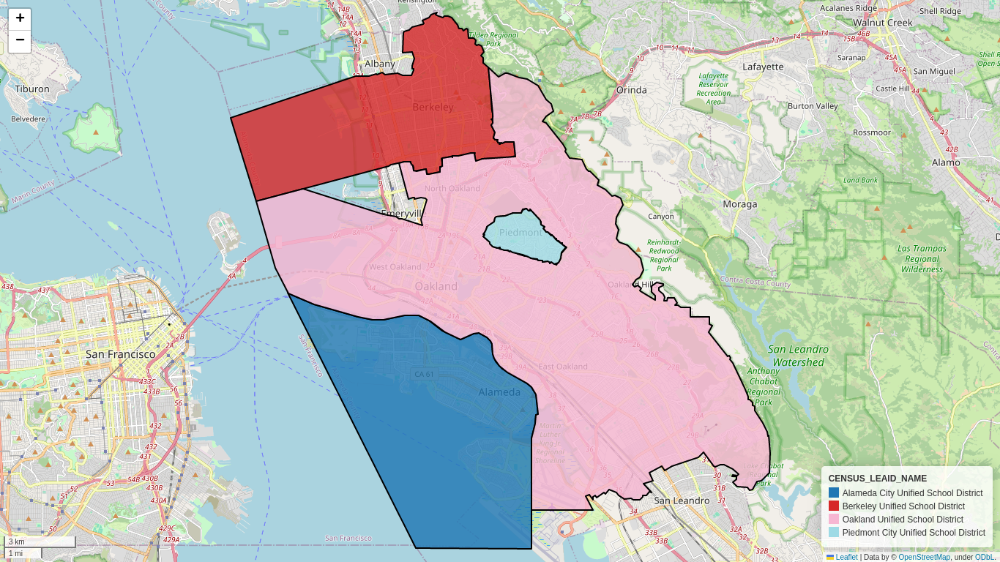

In [15]:
district_map = school_districts_Alameda_2020[school_districts_Alameda_2020['CENSUS_LEAID'].isin([
  #'0601860', # Albany City Unified
  '0604740', # Berkeley Unified
  #'0612630', # Emery Unified
  '0628050', # Oakland Unified
  '0630330', # Piedmont City Unified
  '0601770', # Alameda City Unified
])].explore(
    "CENSUS_LEAID_NAME",
    zoom_start=11.5,
    style_kwds={
        'color' : 'black',
        'fillOpacity' : .8,
    }
)

import io
import selenium
from PIL import Image

image_data = district_map._to_png(5);
img = Image.open(io.BytesIO(district_map._to_png(5)))
img.save("/content/drive/MyDrive/Math 150 Project/figures/districts.png")

img

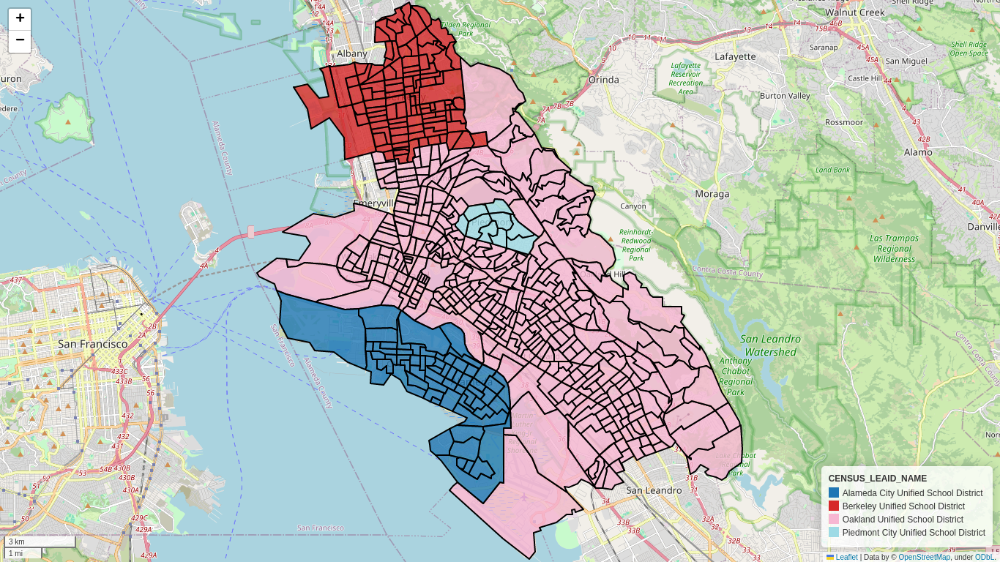

In [16]:
my_custom_gpd_focused = my_custom_gpd[my_custom_gpd['CENSUS_LEAID'].isin([
    #'0601860', # Albany City Unified
    '0604740', # Berkeley Unified
    #'0612630', # Emery Unified
    '0628050', # Oakland Unified
    '0630330', # Piedmont City Unified
    '0601770', # Alameda City Unified
])].copy(deep=True)

my_custom_gpd_focused.reset_index(inplace=True)
my_custom_gpd_focused.drop(labels=['index'],axis=1,inplace=True)
my_custom_gpd_focused_map = my_custom_gpd_focused.explore(
    "CENSUS_LEAID_NAME",
    zoom_start=11.5,
    style_kwds={
        'color' : 'black',
        'fillOpacity' : .8,
    }
)

import io
import selenium
from PIL import Image

image_data = my_custom_gpd_focused_map._to_png(5);
img = Image.open(io.BytesIO(my_custom_gpd_focused_map._to_png(5)))
img.save("/content/drive/MyDrive/Math 150 Project/figures/districts_cb.png")

img

In [17]:
my_custom_gpd_focused.fillna(0, inplace=True)

In [18]:
my_custom_gpd_focused.columns

Index(['GEOID', 'ALAND', 'AWATER', 'M_MINOR', 'M_ADULT', 'F_MINOR', 'F_ADULT',
       'geometry', 'Land', 'Imps', 'TotalNetVa', 'CENSUS_LEAID',
       'CENSUS_LEAID_NAME'],
      dtype='object')

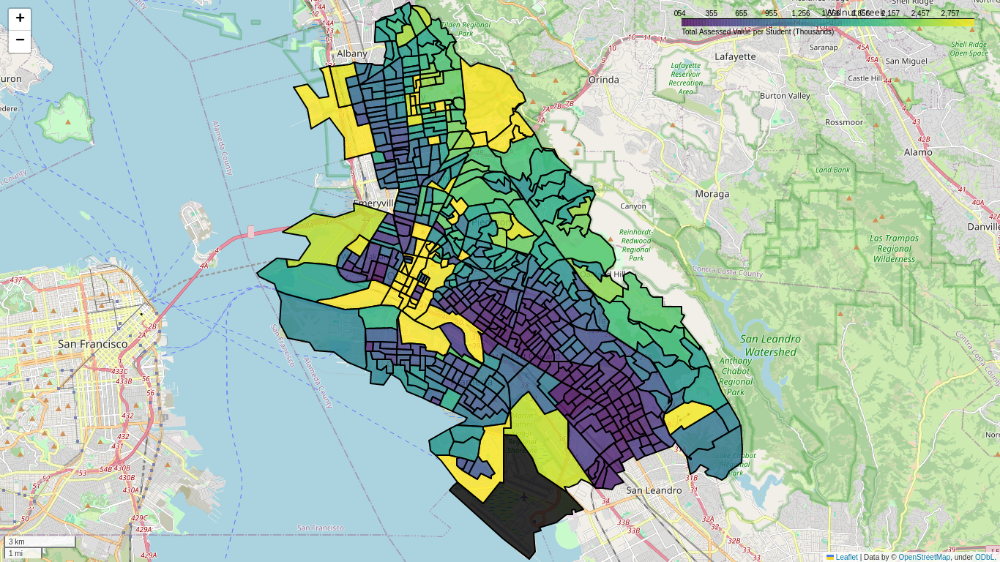

In [19]:
land_value = my_custom_gpd_focused.copy(deep=True)
st = "Total Assessed Value per Student (Thousands)"
land_value[st] = (land_value["TotalNetVa"]/1000) / (land_value["F_MINOR"] + land_value["M_MINOR"])
my_custom_gpd_focused_map = land_value.explore(
    st,
    zoom_start=11.5,
    vmax=3000,
    style_kwds={
        'color' : 'black',
        'fillOpacity' : .8,
    }
)

import io
import selenium
from PIL import Image

image_data = my_custom_gpd_focused_map._to_png(5);
img = Image.open(io.BytesIO(my_custom_gpd_focused_map._to_png(5)))
img.save("/content/drive/MyDrive/Math 150 Project/figures/districts_value.png")

img

# Optimization


In [20]:
import numpy as np
import networkx as nx
import random
import time
import shapely

## Graph Dataset


In [21]:
gdf = my_custom_gpd_focused

Obtain the list of edges which will connect nodes (Census blocks) in the undirected graph $G$

In [22]:
edge_list = []

for b1, block1 in enumerate(gdf['geometry'].to_list()):
  for b2, block2 in enumerate(gdf['geometry'].to_list()):
    if block1.touches(block2):
      if type(block1.intersection(block2)) is not shapely.geometry.point.Point:
        edge_list.append((gdf.at[b1, 'GEOID'], gdf.at[b2, 'GEOID']))

In [23]:
gdf["CENTROID"] = gdf['geometry'].centroid

<ipython-input-23-760e02f47548>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["CENTROID"] = gdf['geometry'].centroid


Create the undirected graph $G$ which contains Census blocks with data located at the nodes.

In [24]:
graph = nx.Graph()

for i in range(gdf.shape[0]):
  graph.add_node(
      gdf["GEOID"].loc[i],
      minor_f=gdf["F_MINOR"].loc[i],
      minor_m=gdf["M_MINOR"].loc[i],
      land_value=gdf["TotalNetVa"].loc[i],
      land_area=gdf["ALAND"].loc[i],
      water_area=gdf["AWATER"].loc[i],
      pos=[gdf["CENTROID"].loc[i].x, gdf["CENTROID"].loc[i].y],
  )

graph.add_edges_from(edge_list)

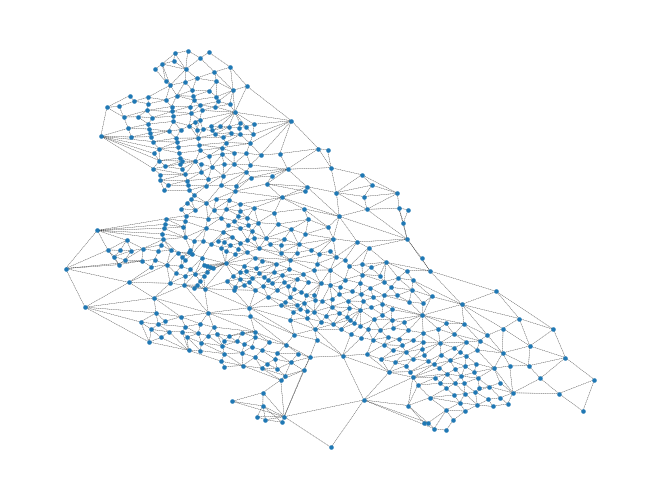

In [25]:
nx.draw(
    graph,
    pos={node: graph.nodes[node]['pos'] for node in graph.nodes},
    node_size=5,
    width=0.25,
    style='--'
)
matplotlib.pyplot.savefig("/content/drive/MyDrive/Math 150 Project/figures/graph-data.pdf")

Create the spanning forest $F$ which contains spanning trees $T_i$ that span each existing district

In [26]:
districts = gdf["CENSUS_LEAID"].unique()
forest = nx.DiGraph()

for d in districts:
  graph_copy = graph.copy()
  outside_blocks = gdf.query(f"CENSUS_LEAID != '{d}'")["GEOID"].tolist()
  graph_copy.remove_nodes_from(outside_blocks)

  tree = nx.algorithms.dfs_tree(graph_copy)
  forest = nx.algorithms.union(forest, tree)

forest.add_nodes_from((i, graph.nodes[i]) for i in graph.nodes)

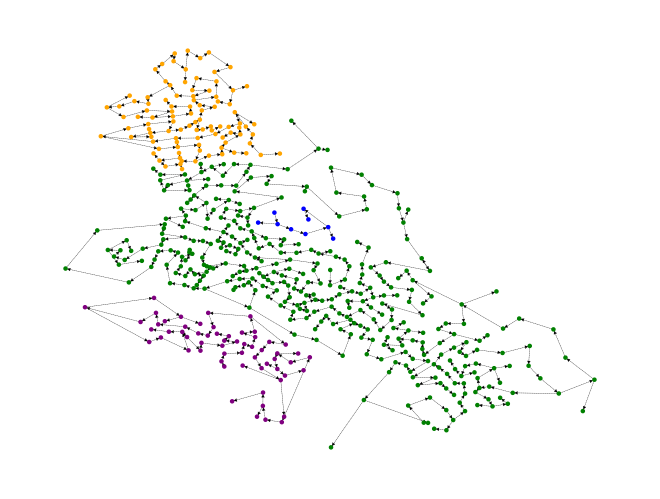

In [27]:
fc = forest.copy(as_view=False)

colors = ['orange', 'green', 'purple', 'blue', 'red']
roots = [x for x in fc.nodes() if fc.in_degree(x)==0]
trees = [nx.dfs_tree(fc, source=x) for x in roots]

for r, root in enumerate(roots):
  tree = nx.bfs_tree(fc,source=root)
  for node in tree.nodes:
    fc.nodes[node]['color'] = colors[r]

nx.draw(
    fc,
    pos={node: fc.nodes[node]['pos'] for node in fc.nodes},
    node_color=[fc.nodes[node]['color'] for node in fc.nodes],
    node_size=5,
    arrowsize=5,
    width=0.25,
    style='--'
)

matplotlib.pyplot.savefig("/content/drive/MyDrive/Math 150 Project/figures/forest-data.pdf")

### Whole Graph Averages

In [28]:
def whole_graph_mean(graph):
  land = np.array([graph.nodes[node]['land_value'] for node in graph.nodes])
  minor_f = np.array([graph.nodes[node]['minor_f'] for node in graph.nodes])
  minor_m = np.array([graph.nodes[node]['minor_m'] for node in graph.nodes])
  minor = minor_f + minor_m

  return {
      'Land Value' : np.sum(land),
      'Land Value Per Student' : np.sum(land)/np.sum(minor),
      'Students' : np.sum(minor),
  }

mean_landvalue, mean_landvalueperstudent, total_students = list(whole_graph_mean(graph).values())

print(mean_landvalueperstudent)
print(total_students/3)

1086316.5794183067
39413.666666666664


## Functions


### Optimization Procedure

In [29]:
def simulated_annealing(fun, graph, forest, **kwargs):
    return forest

def optimizer(fun, graph, forest, **kwargs):
    if 'decay' not in kwargs:
        decay = 1000
    else:
        decay = kwargs['decay']

    if 'max_iter' not in kwargs:
        max_iter = 100
    else:
        max_iter = kwargs['max_iter']

    if 'iter' not in kwargs:
        iter = 1
    else:
        iter = kwargs['iter']

    if len(graph) == len(forest):
        val_iter = []
        while True:
            if 'heat' in kwargs:
                if 'greedy' not in kwargs:
                    greedy = optimizer(fun, graph, forest)
                else:
                    greedy = kwargs['greedy']

            roots = (x for x in forest.nodes if forest.in_degree(x) == 0)
            trees = [forest.subgraph(nx.dfs_tree(forest, source=x)) for x in roots]
            n_trees = len(trees)

            val = fun(forest)
            val_iter.append(val)
            weight = np.Inf
            edge_add = None
            edge_del = None

            for t, tree in enumerate(trees):
                for node in tree.nodes():
                    neighbors = graph.subgraph((x for x in graph.adj[node] if x not in tree))
                    for neighbor in neighbors:
                        forest_eval = forest.copy()
                        forest_eval.remove_edges_from([x for x in forest.edges if x[1]==neighbor])
                        forest_eval.add_edge(node, neighbor)
                        fun_eval = fun(forest_eval) - val
                        if len([x for x in forest_eval.nodes if forest_eval.in_degree(x) == 0]) == n_trees:
                            if fun_eval < weight:
                                weight = fun_eval
                                edge_add = (node, neighbor)
                                edge_del = [x for x in forest.edges if x[1]==neighbor]
                            if 'heat' in kwargs:
                                heat = (1 - (iter + 1)/max_iter)
                                if random.random() < heat*np.exp(heat):
                                    return optimizer(fun, graph, forest_eval, heat=heat, iter=iter+1, greedy=greedy)
            if weight >= 0:
                if 'heat' in kwargs and fun(greedy) < val:
                    return greedy
                return (forest, val_iter)

            val = weight
            forest.remove_edges_from(edge_del)
            forest.add_edge(edge_add[0], edge_add[1])
    else:
        while len(forest) != len(graph):
            val = fun(forest)
            edge = (0,0)
            weight = np.Inf

            for node in forest.nodes():
                neighbors = graph.subgraph((x for x in graph.adj[node] if x not in forest))
                for neighbor in neighbors:
                    forest_eval = forest.copy()
                    forest_eval.add_node(neighbor, **graph.nodes[neighbor])
                    forest_eval.add_edge(node, neighbor)
                    fun_eval = fun(forest_eval)
                    if fun(forest_eval) < weight:
                        weight = fun_eval
                        edge = (node, neighbor)

            forest.add_node(edge[1], **graph.nodes[edge[1]])
            forest.add_edge(edge[0], edge[1])

        return optimizer(fun, graph, forest, **kwargs)

### Objective Function

#### Compactness

In [30]:
compact_initial = 1;

def obj_f_compact(forest,trees=None):
  if trees is None:
    roots = [x for x in forest.nodes() if forest.in_degree(x)==0]
    trees = [forest.subgraph(nx.dfs_tree(forest, source=x)) for x in roots]

  area = np.zeros(shape=(len(trees),))
  length = np.zeros(shape=(len(trees),))

  for t, tree in enumerate(trees):
    points = []
    for node in tree.nodes:
      points.append(tree.nodes[node]["pos"])
      #area[t] += tree.nodes[node]["land_area"]
    points = shapely.multipoints(points)
    concave_hull = shapely.concave_hull(points)
    area[t] = shapely.area(concave_hull)
    length[t] = shapely.length(concave_hull)

  #shapes = [shapely.union_all(gdf.loc[gdf['GEOID'].isin(tree), 'geometry'].tolist()) for tree in trees]
  #area = np.array([shapely.area(shape) for shape in shapes])
  #length = np.array([shapely.length(shape) for shape in shapes])

  obj = area/length

  return (1/obj.shape[0])*np.sum(obj)/compact_initial;

compact_initial = obj_f_compact(forest);
compact_initial

0.0025245160804651624

#### Land Value

In [31]:
land_initial = 1;

def obj_f_land(forest,trees=None):
  if trees is None:
    roots = [x for x in forest.nodes() if forest.in_degree(x)==0]
    trees = [forest.subgraph(nx.dfs_tree(forest, source=x)) for x in roots]

  m = np.zeros(shape=(len(trees),))
  f = np.zeros(shape=(len(trees),))
  land = np.zeros(shape=(len(trees),))

  for t, tree in enumerate(trees):
      for node in tree.nodes:
          try:
              m[t] += tree.nodes[node]["minor_m"]
              f[t] += tree.nodes[node]["minor_f"]
              land[t] += tree.nodes[node]["land_value"]
          except:
              print(f"{node}: {tree.nodes[node]}")
              raise Exception

  p = m + f;
  obj = (land/p);
  obj_mean = mean_landvalueperstudent;
  return (1/obj.shape[0])*np.sum(np.abs(obj - obj_mean))/land_initial;

land_initial = obj_f_land(forest);
land_initial

426459.76085907104

#### Student Population Size



In [32]:
student_initial = 1;

def obj_f_students(forest,trees=None):
  if trees is None:
    roots = [x for x in forest.nodes() if forest.in_degree(x)==0]
    trees = [forest.subgraph(nx.dfs_tree(forest, source=x)) for x in roots]

  m = np.zeros(shape=(len(trees),))
  f = np.zeros(shape=(len(trees),))

  for t, tree in enumerate(trees):
      for node in tree.nodes:
          try:
              m[t] += tree.nodes[node]["minor_m"]
              f[t] += tree.nodes[node]["minor_f"]
          except:
              print(f"{node}: {tree.nodes[node]}")
              raise Exception

  obj = m + f;
  obj_mean = total_students/len(trees)

  return (1/obj.shape[0])*np.sum(np.abs(obj - obj_mean))/student_initial;

student_initial = obj_f_students(forest);
student_initial

27345.375

#### Combined Objective Function


In [33]:
def obj_f(forest):
  roots = [x for x in forest.nodes() if forest.in_degree(x)==0]
  trees = [forest.subgraph(nx.dfs_tree(forest, source=x)) for x in roots]
  return (
      2*obj_f_land(forest,trees=trees)
      + .6*obj_f_compact(forest,trees=trees)
      + .4*obj_f_students(forest,trees=trees)
  )/3

obj_f(forest)

1.0

In [34]:
f0 = forest.copy()
res, res_iter = optimizer(obj_f,graph,f0)

<ipython-input-30-e9c83547945a>:25: RuntimeWarning: invalid value encountered in divide
  obj = area/length


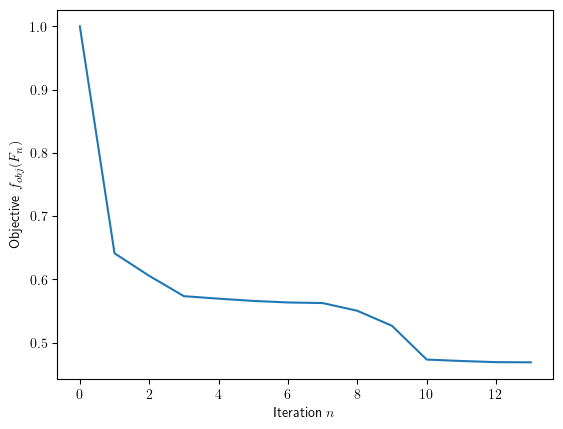

In [35]:
import matplotlib.pyplot as plt
plt.rcParams.update({
    "text.usetex": True,
})
plt.plot(np.arange(0,len(res_iter)), np.array(res_iter))
plt.xlabel("Iteration $n$")
plt.ylabel("Objective $f_{obj}(F_n)$")

matplotlib.pyplot.savefig("/content/drive/MyDrive/Math 150 Project/figures/convergence.pdf")

In [36]:
res.nodes['060014238002']

{'minor_f': 122,
 'minor_m': 99,
 'land_value': 567117037.0,
 'land_area': 399341,
 'water_area': 0,
 'pos': [-122.24499840073474, 37.854278128603895]}

In [37]:
import branca.colormap as cm

def make_gdf(res):
  roots = [x for x in res.nodes() if res.in_degree(x)==0]
  trees = [nx.dfs_tree(res, root) for root in roots]
  for tree in trees:
    tree.add_nodes_from((i, res.nodes[i]) for i in res.nodes if i in tree)

  minor_f = np.array([np.sum(list(nx.get_node_attributes(tree, "minor_f").values())) for tree in trees])
  minor_m = np.array([np.sum(list(nx.get_node_attributes(tree, "minor_m").values())) for tree in trees])
  land = np.array([np.sum(list(nx.get_node_attributes(tree, "land_value").values())) for tree in trees])

  shapes = [shapely.union_all(gdf.loc[gdf['GEOID'].isin(tree), 'geometry'].tolist()) for tree in trees]

  new_gdf = gpd.GeoDataFrame({
      #"Name" : ["Piedmont"],
      "Minors (Female)" : minor_f,
      "Minors (Male)" : minor_m,
      "Minors" : minor_m + minor_f,
      "Minors (Mean Deviation)" : minor_m + minor_f - total_students/len(roots),
      "Land Value" : land,
      "Land Value Per Student" : land/(minor_f + minor_m),
      "Land Value Per Student (Mean Deviation)" : land/(minor_f + minor_m) - mean_landvalueperstudent,
      "geometry" : shapes,
  },
  crs="EPSG:4326")

  new_gdf["Minors (Mean Deviation)"] = new_gdf["Minors (Mean Deviation)"].astype(np.int64)
  new_gdf["Land Value"] = new_gdf["Land Value"].astype(np.int64)
  new_gdf["Land Value Per Student"] = new_gdf["Land Value Per Student"].astype(np.int64)
  new_gdf["Land Value Per Student (Mean Deviation)"] = new_gdf["Land Value Per Student (Mean Deviation)"].astype(np.int64)

  return new_gdf

In [38]:
forest_gdf = make_gdf(forest)
res_gdf = make_gdf(res)

In [39]:
total_students/4

29560.25

In [40]:
forest_gdf.explore()

In [41]:
forest_gdf

,Minors (Female),Minors (Male),Minors,Minors (Mean Deviation),Land Value,Land Value Per Student,Land Value Per Student (Mean Deviation),geometry
0,7504,7890,15394,-14166,26048816003,1692140,605824,"POLYGON ((-122.28190 37.84698, -122.28271 37.8..."
1,41278,42973,84251,54690,78460164446,931266,-155049,"POLYGON ((-122.27824 37.79313, -122.28440 37.7..."
2,7646,7963,15609,-13951,18087138737,1158763,72446,"POLYGON ((-122.25701 37.75632, -122.26114 37.7..."
3,1408,1579,2987,-26573,5851039481,1958834,872518,"POLYGON ((-122.21146 37.81942, -122.21025 37.8..."


In [42]:
res_gdf

,Minors (Female),Minors (Male),Minors,Minors (Mean Deviation),Land Value,Land Value Per Student,Land Value Per Student (Mean Deviation),geometry
0,4996,5116,10112,-19448,14070713086,1391486,305170,"POLYGON ((-122.28449 37.83672, -122.28558 37.8..."
1,834,822,1656,-27904,1759177842,1062305,-24011,"POLYGON ((-122.21947 37.79793, -122.21858 37.7..."
2,4885,5149,10034,-19526,10890908983,1085400,-916,"POLYGON ((-122.26114 37.75776, -122.26211 37.7..."
3,47121,49318,96439,66878,101726358756,1054825,-31490,"POLYGON ((-122.27824 37.79313, -122.28440 37.7..."


In [43]:
res_gdf["Name"] = [
    "Berkeley Unified School District",
    "Piedmont City Unified School District",
    "Alameda City Unified School District",
    "Oakland Unified School District",
]
res_gdf.explore("Name")

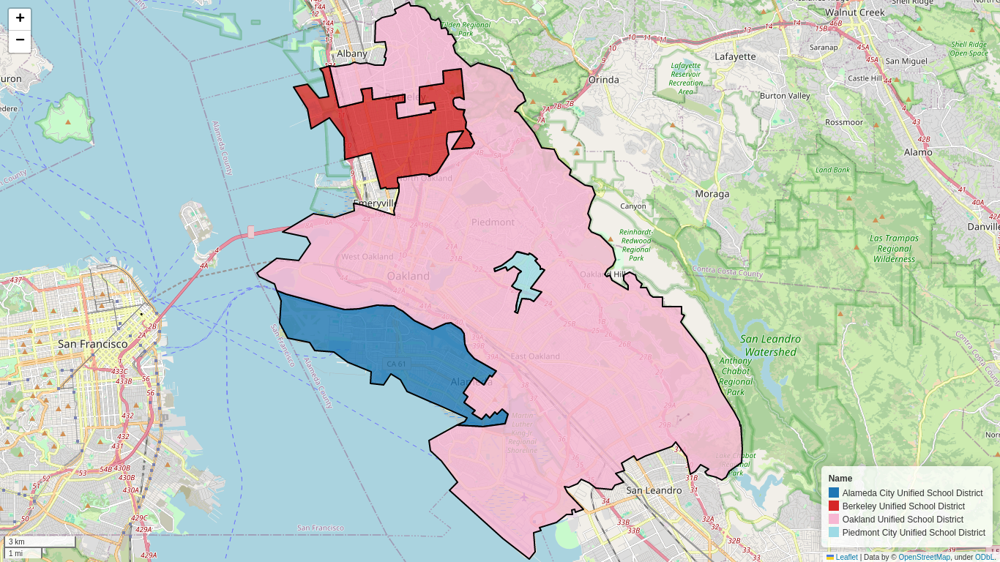

In [44]:
res_map = res_gdf.explore(
    "Name",
    zoom_start=11.5,
    style_kwds={
        'color' : 'black',
        'fillOpacity' : .8,
    }
)

import io
import selenium
from PIL import Image

image_data = res_map._to_png(5);
img = Image.open(io.BytesIO(res_map._to_png(5)))
img.save("/content/drive/MyDrive/Math 150 Project/figures/result.png")

img

In [45]:
forest_gdf["Name"] = [
    "Berkeley Unified School District",
    "Oakland Unified School District",
    "Alameda City Unified School District",
    "Piedmont City Unified School District",
]

forest_gdf.explore("Name")

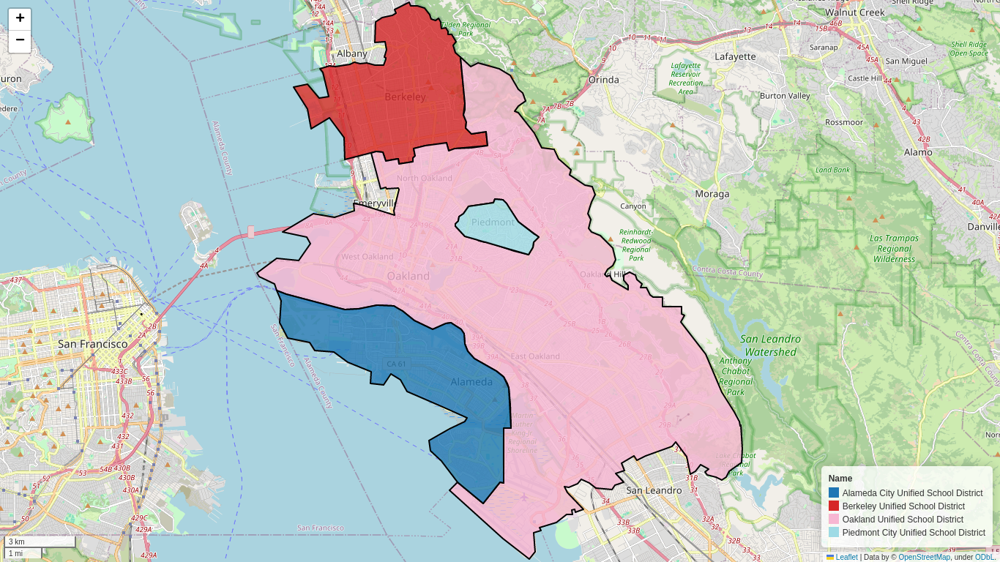

In [46]:
forest_gdf = forest_gdf.explore(
    "Name",
    zoom_start=11.5,
    style_kwds={
        'color' : 'black',
        'fillOpacity' : .8,
    }
)

import io
import selenium
from PIL import Image

image_data = forest_gdf._to_png(5);
img = Image.open(io.BytesIO(forest_gdf._to_png(5)))
img.save("/content/drive/MyDrive/Math 150 Project/figures/result_before.png")

img

In [49]:
len(forest.nodes)

522